In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Previsões Médicas 
   - Um paciente com câncer pode ter dois tipos de tumores: O maligo e o Benigno. Isso pode ser identificado com algumas caracteristicas. 
### O objetivo desse projeto é criar um modelo que auxilie um hospital a acelerar a identificação do tipo dos tumores. Isso é inteligente pois, visto que as características seguem um padrão, uma IA pode analisar em milesimos. 
 
### Utilizaremos o Naive Bayes a principio pois queremos que o algoritmo estude a base historica e gere uma tabela de probabilidade, afinal, queremos saber qual será o valor mais provavel, que posteriormente será utilizado para identificação.

# 

# 

# 1) importando o arquivo disposto no : "https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data"

In [82]:
df = pd.read_csv('cancer.csv',sep=',')

In [83]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


# 2) Pré processamento dos dados

In [84]:
#para não temos que fazer o onehotencoder/labelbinarizer, como só temos duas variaveis aqui, optei por simplesmente alterar o valor delas para um valor binario
df.loc[df['diagnosis'] == 'M','diagnosis'] = 1
df.loc[df['diagnosis'] == 'B','diagnosis'] = 0

In [85]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [86]:
#desvio padrão totalmente fora de escala
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


In [88]:
#Como pretendo usar o naive bayes, quando eu for escalonar preciso que os valores sejam numéricos,antes estava como obj
df['diagnosis'] = df['diagnosis'].astype(int)

  0%|                                                                                                      | 0…

C:\Users\luis.bezerra.ext\a\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
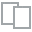
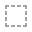
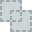
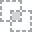
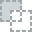
...
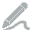
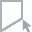
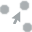
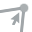
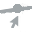

In [90]:
# pre visualização dos dados
from dataprep.eda import create_report
create_report(df)

### Observações : É notavel que os graficos dispostos na pré visualização seguem uma distribuição gausiana, ou seja, formam parabólas. Porém, sem escala. Então para que possamos trabalhar com esses dados vamos precisar organiza-los.


In [91]:
#eliminando dados categoricos nominais e a coluna que não sera necessaria. (o id nesse caso não ajudará em nada na nossa previsão)
df= df.drop(['id','Unnamed: 32'],axis=1)

In [92]:
# Por curiosidade, como meu objetivo final é descobrir se é benigno ou maligno, quero ver a distribuição dessa variavel, afinal, se eu utilizasse essa variavel como meta e os dados não fossem bem distribuidos, eu poderia ter um modelo com viés, ou seja, ele iria fazer predições baseadas na quantidade de resultados e não nas caracteristicas históricas.
M = df[df.diagnosis == 1]
B = df[df.diagnosis == 0]

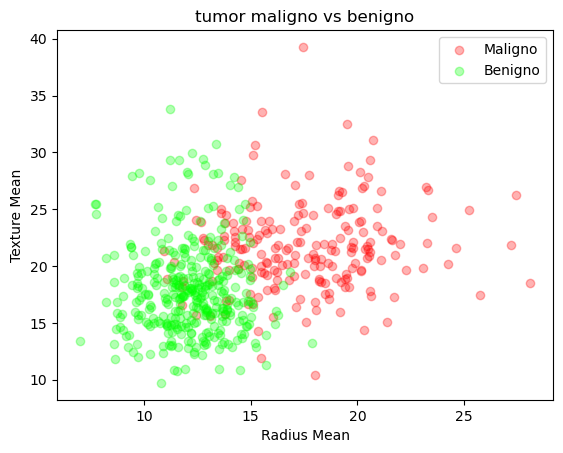

In [93]:
plt.title("tumor maligno vs benigno")
plt.xlabel('Radius Mean')
plt.ylabel('Texture Mean')
plt.scatter(M.radius_mean,M.texture_mean,color='red',label='Maligno',alpha=0.3)
plt.scatter(B.radius_mean,B.texture_mean,color='lime',label='Benigno',alpha=0.3)
plt.legend()
plt.show()

### Observação : ótima distribuição. Como o problema do negócio é descobrir se é benigno ou maligno, da pra ver que essas variaveis se distinguem bem. Serão otimas para usarmos como meta.
 - Ou seja, dado minhas variaveis explicativas (texture mean e radius mean), consigo chegar num resultado claro de diagnosis.

In [94]:
#agora que confirmei que é uma boa variavel preditiva (e o que meu negocio quer a resposta), vamos isolar os valores em uma nova variavel
#vou tirar do df(que agora sera x, mas sem a coluna diagnosis) e colocar a col diagnosis no y,sozinha.
x = df.drop(['diagnosis'],axis = 1)
y = df.diagnosis.values

In [95]:
y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

# 3) Padronização de escala

In [96]:
from sklearn.preprocessing import StandardScaler
# vou utilizar a função StandarScaler para que os meus valores estejam sob a mesma escala de valores, para que quando meu modelo for submetido a um grafico, podermos ver de forma mais elegante a parabola, seguindo o mesmo desvio padrão, e assim, diminuindo a margem de erro.
# submetendo meu df anteriormente colocado no X para fit/transform
scaler = StandardScaler().fit(x)
standardX = scaler.transform(x)

In [97]:
# esse passo é opcional, mas por curiosidade, gosto de ver como ficou meu df
df2= pd.DataFrame(standardX)

In [98]:
# veja que a distribuição segue um mesmo desvio padrão. e os quartis são até proximos.
df2.describe().T #(uso o T para transpor o describe, por questões de visualização)

,count,mean,std,min,25%,50%,75%,max
0,569.0,-1.373633e-16,1.00088,-2.029648,-0.689385,-0.215082,0.469393,3.971288
1,569.0,6.868164e-17,1.00088,-2.229249,-0.725963,-0.104636,0.584176,4.651889
2,569.0,-1.248757e-16,1.00088,-1.984504,-0.691956,-0.235980,0.499677,3.976130
3,569.0,-2.185325e-16,1.00088,-1.454443,-0.667195,-0.295187,0.363507,5.250529
4,569.0,-8.366672e-16,1.00088,-3.112085,-0.710963,-0.034891,0.636199,4.770911
5,569.0,1.873136e-16,1.00088,-1.610136,-0.747086,-0.221940,0.493857,4.568425
6,569.0,4.995028e-17,1.00088,-1.114873,-0.743748,-0.342240,0.526062,4.243589
7,569.0,-4.995028e-17,1.00088,-1.261820,-0.737944,-0.397721,0.646935,3.927930
8,569.0,1.748260e-16,1.00088,-2.744117,-0.703240,-0.071627,0.530779,4.484751
9,569.0,4.745277e-16,1.00088,-1.819865,-0.722639,-0.178279,0.470983,4.910919


# 4) TREINO X TESTE


In [99]:
#Como conhecido e muito utilizado, vou utilizar a função de split, para dividir os dados de treino e os dados de teste.
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(standardX,y,test_size = 0.2,random_state=42)
#todas essas 4 variaveis sofrerão o split. sendo:
#Standard X = meu df escalonado e padronizado
# y = o valor da previsão, e meu valor meta
#test size = quero apenas 20 % para teste, ou seja, utilizarei 80% do df para treino (isso é testavel e altera diretamente o valor do modelo)
# random state = são a quantidade de vezes que meu modelo ira fazer os calculos antes de cuspir os valores. o valor 42 é o default

In [100]:
# como escalonamos e nossos dados entram no modelo Gausiano, vou submeter meus dados para finalizarmos o modelo.
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(x_train,y_train)

GaussianNB()

In [145]:
# os dados de treino foram submetidos, ou seja, o modelo foi criado, agora hora de aplicar o modelo nos dados de teste.
prc  = (nb.score(x_test,y_test)*100)
print('Nivel de assertividade do Modelo: 'f'{prc:.2f}%')

Nivel de assertividade do Modelo: 96.49%


In [210]:
novo = pd.read_excel('nova_base_cancer.xlsx')

In [211]:
novo

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,28.12,11.38,132.8,1001.0,0.11990,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,30.21,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,40.01,15.77,172.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,11.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,14.69,29.25,170.0,1203.0,0.10930,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,40.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


In [212]:
scaler = StandardScaler().fit(novo)
standardscaler2 = scaler.transform(novo)

In [213]:
dno=pd.DataFrame(standardscaler2)

In [214]:
re = nb.predict(standardscaler2)
re = pd.DataFrame(re)
novo['Tipo'] = re
novo.loc[novo['Tipo']==1,'Tipo'] = 'Maligno'
novo.loc[novo['Tipo']==0,'Tipo'] = 'Benigno'
novo

C:\Users\luis.bezerra.ext\a\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Tipo
0,28.12,11.38,132.8,1001.0,0.11990,0.27760,0.3001,0.14710,0.2419,0.07871,...,30.21,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,Maligno
1,40.01,15.77,172.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,11.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,Benigno
2,14.69,29.25,170.0,1203.0,0.10930,0.15990,0.1974,0.12790,0.2069,0.05999,...,40.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,Benigno


#### CRIANDO UMA FUNÇÃO QUE FAZ O ESCALONAMENTO E ME RETORNA OS VALORES JÁ NO DF

In [239]:
def Naive_cancer(df):
    scaler = StandardScaler().fit(df)
    standardscaler2 = scaler.transform(df)
    re = nb.predict(standardscaler2)
    re = pd.DataFrame(re)
    df['Tipo'] = re
    df.loc[df['Tipo']==1,'Tipo'] = 'Maligno'
    df.loc[df['Tipo']==0,'Tipo'] = 'Benigno'
    return df

## JOGANDO DADOS PARA O MODELO

In [240]:
novo1 = pd.read_excel('nova_base_cancer.xlsx')

In [241]:
Naive_cancer(novo1)

C:\Users\luis.bezerra.ext\a\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Tipo
0,28.12,11.38,132.8,1001.0,0.11990,0.27760,0.3001,0.14710,0.2419,0.07871,...,30.21,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,Maligno
1,40.01,15.77,172.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,11.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,Benigno
2,14.69,29.25,170.0,1203.0,0.10930,0.15990,0.1974,0.12790,0.2069,0.05999,...,40.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,Benigno


# FINAL

In [251]:
# Para eu não criar um dataframe do 0, vou utilizar o que eu tenho mas mudando os valores das colunas que o modelo usa.
nv2 = x.head(20)
nv2[['radius_mean','texture_mean']] = nv2[['radius_mean','texture_mean']].apply(lambda x: x*0.5)

C:\Users\luis.bezerra.ext\AppData\Local\Temp\ipykernel_12004\2052594501.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nv2[['radius_mean','texture_mean']] = nv2[['radius_mean','texture_mean']].apply(lambda x: x*0.5)


In [253]:
nv2.to_excel('Novos_dados_cancer.xlsx',index=False)

In [254]:
novos_testes = pd.read_excel('Novos_dados_cancer.xlsx')

In [256]:
Naive_cancer(novos_testes)

C:\Users\luis.bezerra.ext\a\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Tipo
0,8.995,5.190,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.26540,0.4601,0.11890,Maligno
1,10.285,8.885,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.18600,0.2750,0.08902,Maligno
2,9.845,10.625,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.24300,0.3613,0.08758,Maligno
3,5.710,10.190,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.25750,0.6638,0.17300,Maligno
4,10.145,7.170,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.16250,0.2364,0.07678,Maligno
5,6.225,7.850,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.17410,0.3985,0.12440,Benigno
6,9.125,9.990,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,0.05742,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.19320,0.3063,0.08368,Maligno
7,6.855,10.415,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451,...,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.15560,0.3196,0.11510,Benigno
8,6.500,10.910,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389,...,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.20600,0.4378,0.10720,Benigno
9,6.230,12.020,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243,...,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.22100,0.4366,0.20750,Maligno
